In [133]:

# for dealing with matrices
import numpy as np

# For plotting 2D and 3D graphs
import plotly
import plotly.graph_objs as go
import plotly.express as px
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scprep # has nice shortcuts to plt scatter

# for status bars
from tqdm.notebook import tqdm, trange

# handy functions
from sklearn.metrics.pairwise import euclidean_distances
import graphtools

# Reload any changes 
%load_ext autoreload
%autoreload 2

# Initialize plotters
plotly.offline.init_notebook_mode() # Configure Plotly to be rendered inline in the notebook.
sns.set()
%matplotlib inline

# a few short handy functions
def plot_3d(X,distribution,title="",lim=1):
    d = {'x':X[:,0],'y':X[:,1],'z':X[:,2],'colors':distribution}
    df = pd.DataFrame(data=d)
    fig = px.scatter_3d(df, x='x',y='y',z='z',color='colors', title=title, range_x=[-lim,lim], range_y=[-lim,lim],range_z=[-lim,lim])
    fig.show()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [134]:
from pecan import MID
from pecan import data

We'll do the first experiments on the sphere, using the MID distance along recursive midpoints.

In [135]:
X = data.sphere(6000)
G = graphtools.graphs.kNNGraph(X, decay=None, knn=5)
P = G.P.toarray()

Calculating KNN search...
Calculated KNN search in 0.03 seconds.


/Users/adjourner/Library/Caches/pypoetry/virtualenvs/pecan-CtxN46k2-py3.7/lib/python3.7/site-packages/scprep/plot/utils.py:104: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



<Axes3DSubplot:>

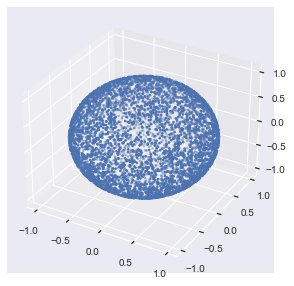

In [138]:
scprep.plot.scatter3d(X)

Is this graph sufficiently sparsely connected?

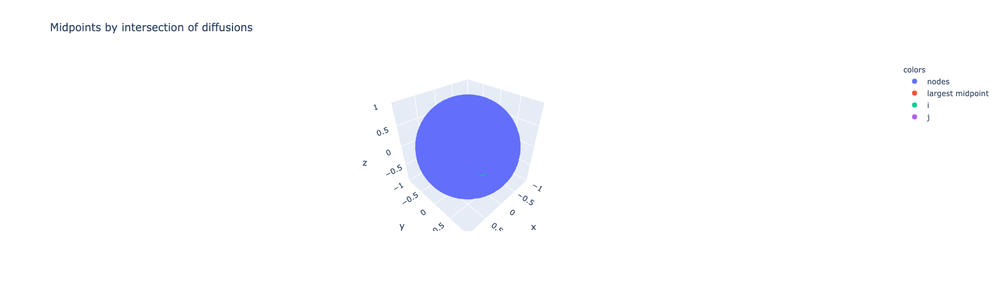

In [145]:
i = 500
j = 2065
midpoints = MID.find_diffusion_midpoint(i,j, P, threshold=0)
distribution = ['nodes']*P.shape[0]
distribution[midpoints[0]] = "largest midpoint"
for m in midpoints[1:]:
    distribution[m]='midpoints'
distribution[i] = 'i'
distribution[j] = 'j'
plot_3d(X,distribution,title="Midpoints by intersection of diffusions")

Yes, it is!

# Distance Check-in
If MID's midpoints are accurate, then $d(a,b) + d(bc)$ should very nearly equal $d(a,c)$. Is this the case with MID's euclidean distance estimation?

In [139]:
# first, make the euclidean distance matrix
Euclidean_D = euclidean_distances(X)

In [12]:
i = 1800
j = 50
midpoints = MID.find_diffusion_midpoint(i,j, P, threshold=0)
m = midpoints[0] # the highest probability midpoint

0.0 0
0.0 0
0.0 0
0.0 0
0.0 0
0.0 0
0.0 0
0.0 0
0.0 0
0.0 0
0.0 0
0.0 0
0.0 0
1.5700685811440374e-25 3


In [20]:
im = MID.MIDdistance(i,m,P,D,threshold=0,num_iterations=4)
im

1.6057246309244253

In [22]:
mj = MID.MIDdistance(m,j,P,D,threshold=0,num_iterations=4)
mj

1.6869155458639211

In [24]:
ij = MID.MIDdistance(i,j,P,D,threshold=0,num_iterations=4)
ij

2.9388097982158623

In [25]:
im + mj - ij

0.3538303785724839

Hmm. That's fairly significant.

In [26]:
def geodesic_checker(i,m,j,P,D,num_iterations=4,threshold=0):
    im = MID.MIDdistance(i,m,P,D,threshold=threshold,num_iterations=num_iterations)
    mj = MID.MIDdistance(m,j,P,D,threshold=threshold,num_iterations=num_iterations)
    ij = MID.MIDdistance(i,j,P,D,threshold=threshold,num_iterations=num_iterations)
    return im + mj - ij

In [38]:
i = np.random.choice(len(X))
j = np.random.choice(len(X))
midpoints = MID.find_diffusion_midpoint(i,j, P, threshold=0)
m = midpoints[0] # the highest probability midpoint
geodesic_checker(i, m, j, P, D, num_iterations=5, threshold=0)

iteration 0
iteration 1
iteration 2
iteration 3
iteration 4
iteration 0
iteration 1
iteration 2
iteration 3
iteration 4
iteration 0
iteration 1
iteration 2
iteration 3
iteration 4


0.17268270389821705

In [46]:
avg_error = 0
n = 20
for ii in range(n):
    i = np.random.choice(len(X))
    j = np.random.choice(len(X))
    midpoints = MID.find_diffusion_midpoint(i,j, P, threshold=0)
    m = midpoints[0] # the highest probability midpoint
    avg_error += geodesic_checker(i, m, j, P, D, num_iterations=6, threshold=0)
avg_error = avg_error/n
print(f"Found average error {avg_error}")

iteration 0
iteration 1
iteration 2
iteration 3
iteration 4
Really? i == i.
Really? i == i.
iteration 5
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
iteration 0
iteration 1
iteration 2
iteration 3
iteration 4
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
iteration 5
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
iteration 0
iteration 1
iteration 2
iteration 3
iteration 4
iteration 5
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
iteration 0
iteration 1
iteration 2
iteration 3
Really? i == i.
Really? i == i.
iteration 4
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
iteration 5
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
Really? i == i.
iteratio

In [47]:
avg_error

0.06650564712736881

The conclusions: 

1. The average error is very low, when using `num_iter=5`! That means that these `MIDdistance` is accurately capturing the geodesic distance. But...
2. Just taking 60 distance measurements takes around 30 seconds. That's slow. The bulk of the work is probably spent constructing recursive midpoints. 
3. To 2, we might be able to speed that up somewhat by only taking midpoints between midpoints if a certain euclidean distance is exceeded.

Just for this proof of concept, I'm going to continue using MID distances. To scale the algorithm, we'll probably want to use PHATE distances.

In [49]:
a = np.array([1,2,3,4,5,6,7,8,9,10,12])
b = np.array([4,5,6,7])
np.setdiff1d(a,b,assume_unique=True)

array([ 1,  2,  3,  8,  9, 10, 12])

In [147]:
x = 5100
curvatures, ring, triangle_endpoints = MID.MIDcurvature(x,P,Euclidean_D,radius_hops=25)
ring

MC int 1.422612516121328
MC euc 1.2960024813765674
MC int 1.4148388425687781
MC euc 1.2897128503691928
MC int 1.7656020910043746
MC euc 1.3902766067956869
MC int 1.1393882361540082
MC euc 1.2902041104438882


array([  36,   79,  151,  171,  265,  359,  518,  539,  590,  618,  630,
        658,  675,  685,  692,  695,  815,  918,  940,  966, 1016, 1044,
       1200, 1395, 1438, 1474, 1503, 1558, 1610, 1620, 1625, 1647, 1656,
       1657, 1688, 1710, 1723, 1817, 1832, 1876, 1889, 1939, 2024, 2043,
       2055, 2096, 2175, 2185, 2223, 2277, 2289, 2292, 2390, 2401, 2430,
       2580, 2617, 2646, 2754, 2787, 2833, 2850, 2891, 2917, 2948, 2950,
       2981, 2985, 3003, 3033, 3075, 3083, 3095, 3210, 3221, 3293, 3313,
       3327, 3390, 3404, 3406, 3419, 3462, 3475, 3515, 3582, 3610, 3615,
       3634, 3690, 3739, 3903, 3990, 4006, 4011, 4054, 4167, 4301, 4376,
       4469, 4502, 4515, 4547, 4631, 4644, 4661, 4814, 4861, 4883, 4924,
       4966, 5037, 5051, 5200, 5209, 5230, 5236, 5296, 5298, 5300, 5306,
       5409, 5437, 5446, 5482, 5502, 5503, 5590, 5751, 5817, 5841, 5857,
       5871, 5912, 5918, 5926])

The ring behaves as expected.

In [140]:
dis = np.zeros(len(X))
dis[ring]=1
plot_3d(X,dis)

In [145]:
curvatures

[-0.12814047342901969]

And yet, the curvatures are all over the place. What's going on? Are the triangles doing okay?

In [146]:
tnum = 0
dis = np.zeros(len(X))
t = triangle_endpoints[tnum]
# chart paths between each endpoint
ids = MID.iterative_midpoints(t,P)
dis[ids] = 2
ids = MID.iterative_midpoints([t[0],x],P)
dis[ids] = 2
ids = MID.iterative_midpoints([t[1],x],P)
dis[ids] = 2
dis[x] = 1
dis[t] = 1.5
plot_3d(X,dis,title=f"Curvature of triangle is {curvatures[tnum]}")

In [143]:
tnum = 2
dis = np.zeros(len(X))
t = triangle_endpoints[tnum]
# chart paths between each endpoint
ids = MID.iterative_midpoints(t,P)
dis[ids] = 2
ids = MID.iterative_midpoints([t[0],x],P)
dis[ids] = 2
ids = MID.iterative_midpoints([t[1],x],P)
dis[ids] = 2
dis[x] = 1
dis[t] = 1.5
plot_3d(X,dis,title=f"Curvature of triangle is {curvatures[tnum]}")

Okay - the '1' emerged because we unfortunately took a degenerate triangle which had zero intrinsic height.

In [126]:
x

500

In [128]:
t

array([5155, 2065])

In [162]:
A = np.random.rand(8,8)

In [163]:
A[5,5]

0.44079006251569597

# Using PHATE distances

In [11]:
from phate import phate
phate_op = phate.PHATE(n_components=10,decay=1)
coords = phate_op.fit_transform(X)

Calculating PHATE...
  Running PHATE on 6000 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.08 seconds.
    Calculating affinities...
    Calculated affinities in 2.17 seconds.
  Calculated graph and diffusion operator in 2.45 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 4.53 seconds.
    Calculating KMeans...
    Calculated KMeans in 23.85 seconds.
  Calculated landmark operator in 30.45 seconds.
  Calculating optimal t...
    Automatically selected t = 22
  Calculated optimal t in 4.54 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.84 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 238.84 seconds.
Calculated PHATE in 277.14 seconds.


If this succeeded, we should now have a good 10d representation of the data, whose euclidean distances mirror the geodesics (to an extent hopefully more true than diffusion distances.)

But we should check that PHATE actually embedded the dataset well.

/Users/adjourner/Library/Caches/pypoetry/virtualenvs/pecan-CtxN46k2-py3.7/lib/python3.7/site-packages/scprep/plot/utils.py:104: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



<AxesSubplot:>

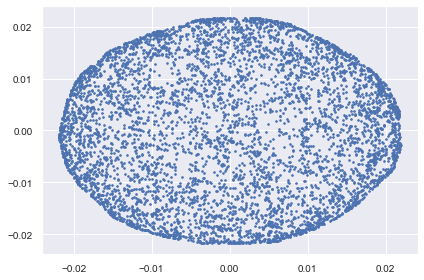

In [12]:
scprep.plot.scatter2d(coords[:,:2])

/Users/adjourner/Library/Caches/pypoetry/virtualenvs/pecan-CtxN46k2-py3.7/lib/python3.7/site-packages/scprep/plot/utils.py:104: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



<Axes3DSubplot:>

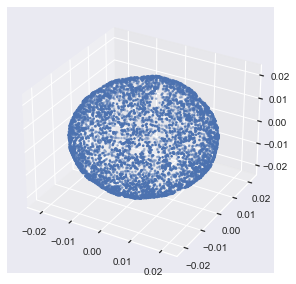

In [114]:
scprep.plot.scatter3d(coords)

In [58]:
plot_3d(coords[:,:3],distribution=X[:,2])

In [15]:
D = euclidean_distances(coords)

Apparently, PHATE has captured the sphere pretty well in the first three dimensions. What are the other dimensions doing? Anything? Are they augmenting the first 3 with enough information to make euclidean distances geodesic distances?

In [24]:
print(min(coords[:,3]),max(coords[:,3]))

-0.0025605118247737976 0.003741027090416623


In [22]:
print(min(coords[:,0]),max(coords[:,0]))

-0.021871631251918103 0.021924894985504432


There seems to be ten times more variation in the first three dimensions as the others. This suggests that the others may be mostly noise.

## Estimating Curvature with PHATE

In [37]:
x = 5100
curvatures, ring, triangle_endpoints = MID.triangle_condition_curvature(x,P,D,radius_hops=25)

powering P
finished powering P
10
MC int 0.025116356890885223
MC euc 0.02200155576718346
MC int 0.02124459432416483
MC euc 0.02130048562245372
MC int 0.023845721830942322
MC euc 0.023777881941209746
MC int 0.02624357718390707
MC euc 0.018824014813151362
MC int 0.026627578011768592
MC euc 0.02451299598523079
MC int 0.026958600459828508
MC euc 0.02570906830965661
MC int 0.029542477845062115
MC euc 0.025374545523040224
MC int 0.02653450517173514
MC euc 0.0246128870184243
MC int 0.013929615605129684
MC euc 0.015911288360964802
MC int 0.021907836070367254
MC euc 0.021314638900084608


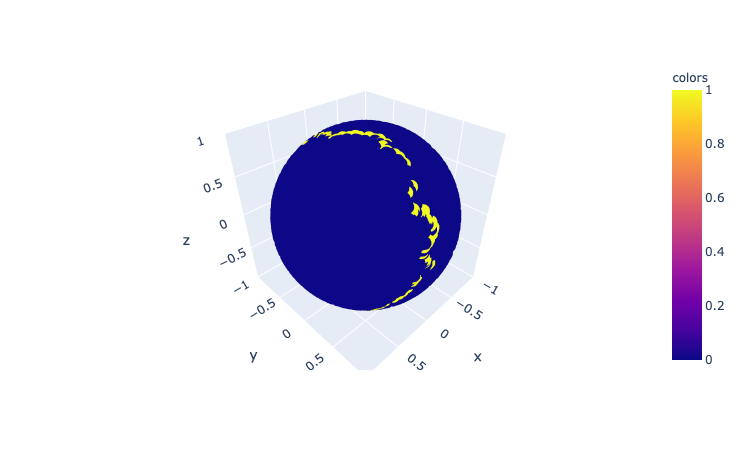

In [38]:
dis = np.zeros(len(X))
dis[ring]=1
plot_3d(X,dis)

In [52]:
np.max(D)

0.04405374922323894

In [39]:
curvatures

[0.003114801123701761,
 -5.589129828889247e-05,
 6.78398897325759e-05,
 0.0074195623707557085,
 0.0021145820265378035,
 0.0012495321501718969,
 0.004167932322021891,
 0.0019216181533108397,
 -0.0019816727558351187,
 0.0005931971702826458]

In [59]:
tnum = -4
dis = np.zeros(len(X))
t = triangle_endpoints[tnum]
# chart paths between each endpoint
# ids = MID.iterative_midpoints(t,P)
# dis[ids] = 2
# ids = MID.iterative_midpoints([t[0],x],P)
# dis[ids] = 2
# ids = MID.iterative_midpoints([t[1],x],P)
# dis[ids] = 2
m2 = MID.find_diffusion_midpoint(t[0],t[1],P)[0]
dis[m2]= 1
dis[x] = 1
dis[t] = 1.5
plot_3d(X,dis,title=f"Curvature of triangle is {curvatures[tnum]}")

In [65]:
PHATE_coords = coords

## Does PHATE shoot geodesic rays? Nope.

In [109]:
from pecan.curvature import DiffusionForkCurvatureV2
dfc = DiffusionForkCurvatureV2(G,n_evecs=2, num_points=100,t=1)

Eigendecomposing diffusion matrix
[-0.31886032 -0.31705623 -0.31534169 ...  0.99949304  0.99952012
  1.        ]


In [110]:
# insert PHATE coordinates instead of diffusion coordinates... Heh heh heh.
dfc.diffusion_coordinates = PHATE_coords

In [111]:
i = 10
j = 3500
ray_coords, ray_deviations, local_points = dfc.diffusion_ray_between(i,j)

In [112]:
np.average(ray_deviations)

1.1792408071647762e-05

In [113]:
distributions = np.zeros(len(X))
distributions[ray_coords]=1
distributions[i]=1.5
distributions[j]=1.5
plot_3d(X,distributions,title="PHATE ray between two points")

# What if we use diffusion probabilities as the basis of the distance?

In [116]:
powered_P = np.linalg.matrix_power(P,25) # raise P to the power used to get the ring

In [122]:
np.diagonal(powered_P)

array([0.0203382 , 0.03493232, 0.02375731, ..., 0.05286671, 0.01250479,
       0.01705886])

In [125]:
np.max(powered_P,axis=1)

array([0.02621367, 0.04024467, 0.02546264, ..., 0.08059722, 0.01855128,
       0.02083465])

That's a problem.

## How about the diffusion time?